## 시험점수 예측

### 1. 데이터셋 불러오기

In [32]:
# 필요한 라이브러리 임포트
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
from matplotlib.ticker import MaxNLocator

# 시각화 스타일 설정
#sns.set_palette('husl')
warnings.filterwarnings('ignore')
plt.style.use('seaborn-v0_8-whitegrid')

# 한글 폰트 설정
plt.rcParams['font.family'] = 'AppleGothic'
plt.rcParams['axes.unicode_minus'] = False

In [33]:
# 데이터 로드
train = pd.read_csv('data/train.csv')
test = pd.read_csv('data/test.csv')

print(f'Train 데이터 크기: {train.shape}')
print(f'Test 데이터 크기: {test.shape}')

# Train과 Test 데이터 합치기 (분석용)
all_data = pd.concat([train, test], ignore_index=True)
print(f'전체 데이터 크기 (Train + Test): {all_data.shape}')

Train 데이터 크기: (630000, 13)
Test 데이터 크기: (270000, 12)
전체 데이터 크기 (Train + Test): (900000, 13)


In [34]:
# 데이터 확인
print('=== 전체 데이터 (Train + Test) 상위 10개 ===' )
display(all_data.head(10))

print('\n=== Test 데이터 상위 10개 ===')
display(test.head(10))

=== 전체 데이터 (Train + Test) 상위 10개 ===


,id,age,gender,course,study_hours,class_attendance,internet_access,sleep_hours,sleep_quality,study_method,facility_rating,exam_difficulty,exam_score
0,0,21,female,b.sc,7.91,98.8,no,4.9,average,online videos,low,easy,78.3
1,1,18,other,diploma,4.95,94.8,yes,4.7,poor,self-study,medium,moderate,46.7
2,2,20,female,b.sc,4.68,92.6,yes,5.8,poor,coaching,high,moderate,99.0
3,3,19,male,b.sc,2.00,49.5,yes,8.3,average,group study,high,moderate,63.9
4,4,23,male,bca,7.65,86.9,yes,9.6,good,self-study,high,easy,100.0
5,5,24,male,b.com,5.04,85.1,yes,9.4,average,online videos,medium,moderate,70.1
6,6,20,male,b.sc,4.28,87.0,no,9.1,average,mixed,high,moderate,63.4
7,7,22,female,ba,4.19,44.9,yes,8.8,good,self-study,high,hard,76.8
8,8,22,other,b.com,1.06,98.3,yes,5.0,poor,mixed,low,moderate,46.7
9,9,18,male,bba,3.44,80.9,yes,6.2,good,group study,medium,easy,58.2



=== Test 데이터 상위 10개 ===


,id,age,gender,course,study_hours,class_attendance,internet_access,sleep_hours,sleep_quality,study_method,facility_rating,exam_difficulty
0,630000,24,other,ba,6.85,65.2,yes,5.2,poor,group study,high,easy
1,630001,18,male,diploma,6.61,45.0,no,9.3,poor,coaching,low,easy
2,630002,24,female,b.tech,6.60,98.5,yes,6.2,good,group study,medium,moderate
3,630003,24,male,diploma,3.03,66.3,yes,5.7,average,mixed,medium,moderate
4,630004,20,female,b.tech,2.03,42.4,yes,9.2,average,coaching,low,moderate
5,630005,21,male,b.sc,6.22,55.3,yes,4.6,average,mixed,high,moderate
6,630006,22,other,ba,3.59,91.6,yes,7.7,good,mixed,medium,moderate
7,630007,20,male,b.sc,3.14,82.7,no,4.2,average,online videos,high,moderate
8,630008,18,male,diploma,6.49,86.0,yes,7.3,poor,group study,high,easy
9,630009,23,female,b.tech,7.72,95.8,yes,6.4,average,coaching,low,easy


In [35]:
df = pd.concat([train, test], axis=0).reset_index(drop=True)

print("Dataset shape:", df.shape)
df

Dataset shape: (900000, 13)


,id,age,gender,course,study_hours,class_attendance,internet_access,sleep_hours,sleep_quality,study_method,facility_rating,exam_difficulty,exam_score
0,0,21,female,b.sc,7.91,98.8,no,4.9,average,online videos,low,easy,78.3
1,1,18,other,diploma,4.95,94.8,yes,4.7,poor,self-study,medium,moderate,46.7
2,2,20,female,b.sc,4.68,92.6,yes,5.8,poor,coaching,high,moderate,99.0
3,3,19,male,b.sc,2.00,49.5,yes,8.3,average,group study,high,moderate,63.9
4,4,23,male,bca,7.65,86.9,yes,9.6,good,self-study,high,easy,100.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
899995,899995,21,other,b.com,2.55,82.3,yes,8.4,average,mixed,medium,hard,NaN
899996,899996,17,female,b.com,0.49,46.4,yes,8.8,good,mixed,low,easy,NaN
899997,899997,22,male,bba,6.62,74.7,yes,5.5,good,coaching,high,easy,NaN
899998,899998,22,other,ba,4.08,51.8,yes,8.7,poor,online videos,high,moderate,NaN


# Student Score Dataset 설명

이 데이터셋은 학생들의 시험 점수(`exam_score`)를 예측하기 위한 다양한 특성들로 구성되어 있습니다.

## 데이터 필드 설명

- **id**: 데이터의 고유 식별자 (학습 시 제외 필요 가능성 있음)
- **age**: 학생의 나이
- **gender**: 성별 (female, male, other)
- **course**: 수강 중인 과정 (예: b.sc, diploma)
- **study_hours**: 일일 공부 시간
- **class_attendance**: 수업 출석률 (%)
- **internet_access**: 인터넷 접근 가능 여부 (yes/no)
- **sleep_hours**: 일일 수면 시간
- **sleep_quality**: 수면의 질 (poor, average, etc.)
- **study_method**: 주된 공부 방법 (online videos, self-study, group study, etc.)
- **facility_rating**: 학습 환경/시설 등급 (low, high, etc.)
- **exam_difficulty**: 시험 난이도
- **exam_score**: 시험 점수 (타겟 변수)


#### 1. 🧪 이과 & 공학 계열 (공부량 많고 수학 빡셈)
##### B.Tech (Bachelor of Technology) → ⚙️ 4년제 공대

기계공학, 전기전자, 토목공학 같은 **'찐 공대생'**들입니다.

보통 공부량이 가장 많고, 수학/과학 난이도가 높아서 고생하는 전공입니다.

##### B.Sc (Bachelor of Science) → 🧬 자연과학대 (이과)

물리학과, 화학과, 수학과, 생물학과 같은 '순수 과학' 전공입니다.

실용 기술보다는 이론과 실험 위주입니다.

##### BCA (Bachelor of Computer Applications) → 💻 소프트웨어/컴퓨터학과

이론보다는 코딩, 앱 개발 등 **'실무 위주의 컴퓨터 전공'**입니다.

B.Tech의 컴공과보다는 수학이 좀 덜하고, 프로그래밍 기술에 집중합니다.

#### 2. 💼 상경 & 인문 계열 (문과)
##### B.Com (Bachelor of Commerce) → 💰 상경대학 (회계/무역)

**'상업'**을 배우는 곳이라 회계, 세무, 금융, 무역 쪽입니다.

문과지만 **숫자(계산)**를 많이 다룹니다.

##### BBA (Bachelor of Business Administration) → 👔 경영학과

우리가 흔히 아는 **'경영학'**입니다. 마케팅, 인사 관리, 조직 행동론 등을 배웁니다.

B.Com보다 이론적이고 관리자 마인드를 배우는 느낌입니다.

##### BA (Bachelor of Arts) → 📚 인문대학 (찐 문과)

국문과(영문과), 역사학과, 철학과, 사회학과 등 **'순수 인문학'**입니다.

글 쓰고 책 읽는 과목이 많습니다.

#### 3. 🎓 기타
##### Diploma → 🛠️ 전문학사 (2~3년제)

4년제 학위(Bachelor)가 아니라, 전문대 졸업이나 기술 자격증 과정을 뜻합니다.

직업 교육 위주라 실습이 많습니다.

In [36]:
# 데이터 정보 확인
print('=== Train 데이터 정보 ===')
train.info()

=== Train 데이터 정보 ===
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 630000 entries, 0 to 629999
Data columns (total 13 columns):
 #   Column            Non-Null Count   Dtype  
---  ------            --------------   -----  
 0   id                630000 non-null  int64  
 1   age               630000 non-null  int64  
 2   gender            630000 non-null  object 
 3   course            630000 non-null  object 
 4   study_hours       630000 non-null  float64
 5   class_attendance  630000 non-null  float64
 6   internet_access   630000 non-null  object 
 7   sleep_hours       630000 non-null  float64
 8   sleep_quality     630000 non-null  object 
 9   study_method      630000 non-null  object 
 10  facility_rating   630000 non-null  object 
 11  exam_difficulty   630000 non-null  object 
 12  exam_score        630000 non-null  float64
dtypes: float64(4), int64(2), object(7)
memory usage: 62.5+ MB


In [37]:
# 기술 통계량
print('=== Train 데이터 기술 통계량 ===')
train.describe()

=== Train 데이터 기술 통계량 ===


,id,age,study_hours,class_attendance,sleep_hours,exam_score
count,630000.000000,630000.000000,630000.000000,630000.000000,630000.000000,630000.000000
mean,314999.500000,20.545821,4.002337,71.987261,7.072758,62.506672
std,181865.479132,2.260238,2.359880,17.430098,1.744811,18.916884
min,0.000000,17.000000,0.080000,40.600000,4.100000,19.599000
25%,157499.750000,19.000000,1.970000,57.000000,5.600000,48.800000
50%,314999.500000,21.000000,4.000000,72.600000,7.100000,62.600000
75%,472499.250000,23.000000,6.050000,87.200000,8.600000,76.300000
max,629999.000000,24.000000,7.910000,99.400000,9.900000,100.000000


In [38]:
# 결측치 확인
print('=== Train 결측치 ===' )
print(train.isnull().sum())
print(f'\n결측치 비율(%):')
print((train.isnull().sum() / len(train) * 100).round(2))

=== Train 결측치 ===
id                  0
age                 0
gender              0
course              0
study_hours         0
class_attendance    0
internet_access     0
sleep_hours         0
sleep_quality       0
study_method        0
facility_rating     0
exam_difficulty     0
exam_score          0
dtype: int64

결측치 비율(%):
id                  0.0
age                 0.0
gender              0.0
course              0.0
study_hours         0.0
class_attendance    0.0
internet_access     0.0
sleep_hours         0.0
sleep_quality       0.0
study_method        0.0
facility_rating     0.0
exam_difficulty     0.0
exam_score          0.0
dtype: float64


### 데이터분석(EDA)

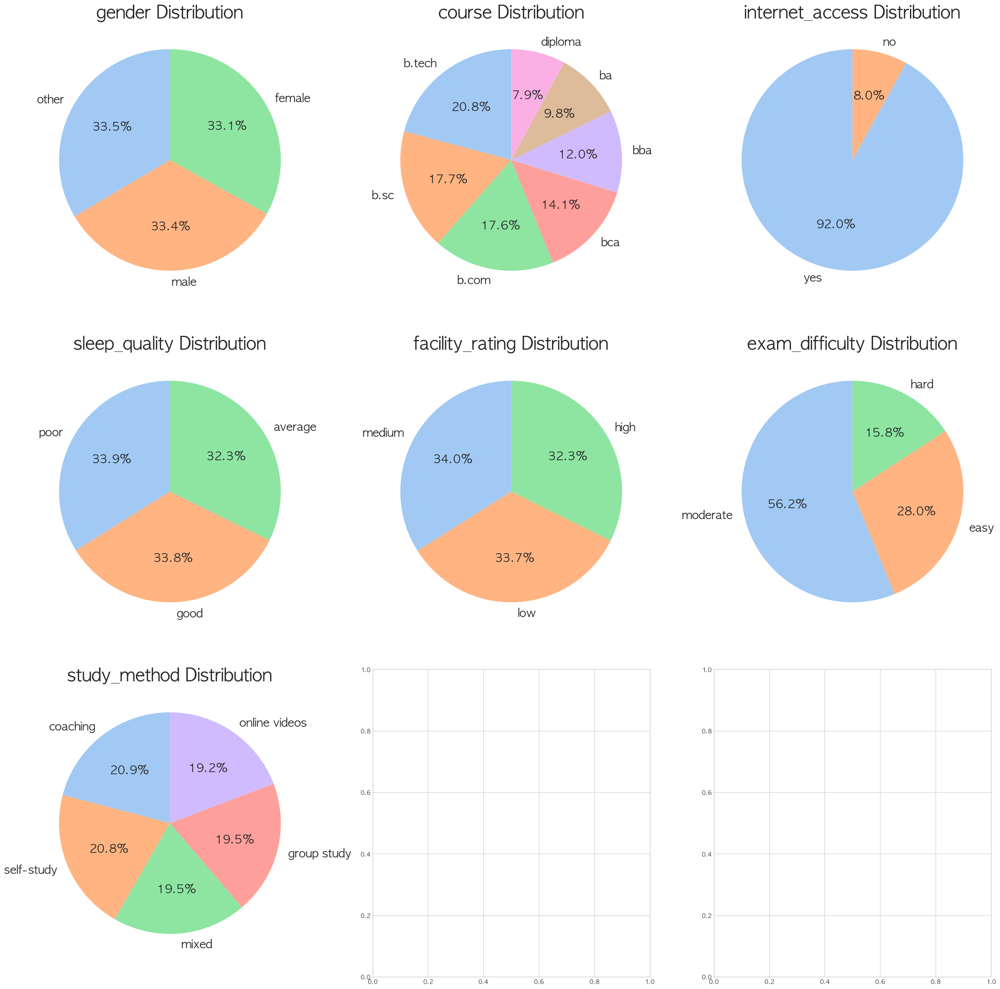

In [39]:
import matplotlib.pyplot as plt
import seaborn as sns

# 시각화할 컬럼 목록
columns_to_plot = ['gender', 'course', 'internet_access', 'sleep_quality', 'facility_rating', 'exam_difficulty','study_method']

# 서브플롯 설정 (2행 3열), 전체 그래프 크기도 좀 더 키움
fig, axes = plt.subplots(3, 3, figsize=(24, 24))
axes = axes.flatten()

for i, col in enumerate(columns_to_plot):
    if col in train.columns:
        # 각 컬럼의 값 빈도 계산
        data_counts = train[col].value_counts()
        
        # 파이 차트 그리기
        # textprops={'fontsize': 14}: 파이 차트 내부 글자(라벨, 퍼센트) 크기 설정
        axes[i].pie(data_counts, labels=data_counts.index, autopct='%1.1f%%', startangle=90, 
                   colors=sns.color_palette("pastel"), textprops={'fontsize': 20})
        
        # 제목 글자 크기 설정 (fontsize=30)
        axes[i].set_title(f'{col} Distribution', fontsize=30, fontweight='bold')
    else:
        axes[i].axis('off') # 컬럼이 없을 경우 빈 공간 처리

# 레이아웃 조정
plt.tight_layout()
plt.show()

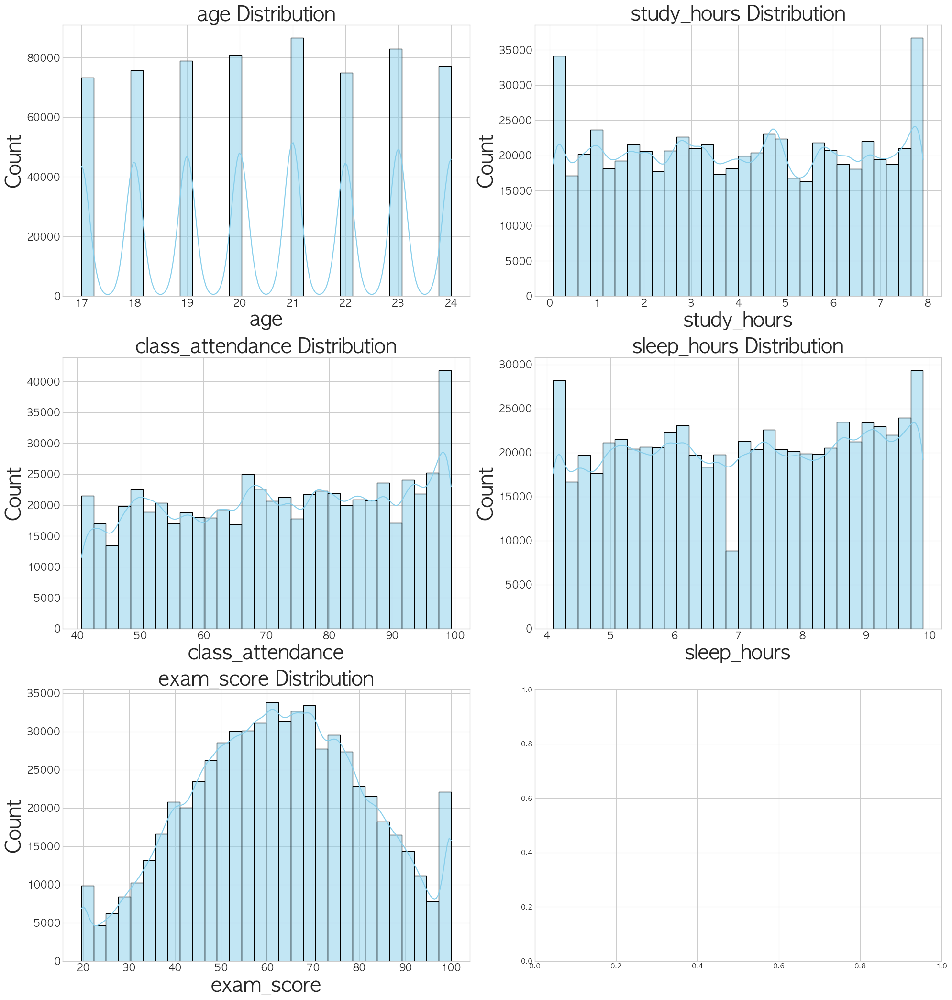

In [76]:
# 수치형 컬럼 목록
numeric_columns = [ 'age', 'study_hours', 'class_attendance', 'sleep_hours', 'exam_score']

# 서브플롯 설정 (2행 2열)
fig, axes = plt.subplots(3, 2, figsize=(20, 21))
axes = axes.flatten()

for i, col in enumerate(numeric_columns):
    if col in train.columns:
        # 히스토그램 그리기 (kde=True: 분포 곡선도 함께 표시)
        sns.histplot(data=train, x=col, kde=True, ax=axes[i], color='skyblue', bins=30)
        
        # 제목 및 라벨 글자 크기 설정
        axes[i].set_title(f'{col} Distribution', fontsize=30, fontweight='bold')
        axes[i].set_xlabel(col, fontsize=30)
        axes[i].set_ylabel('Count', fontsize=30)
        
        # 축 눈금 글자 크기 설정
        axes[i].tick_params(axis='both', which='major', labelsize=15)
    else:
        axes[i].axis('off')

plt.tight_layout()
plt.show()

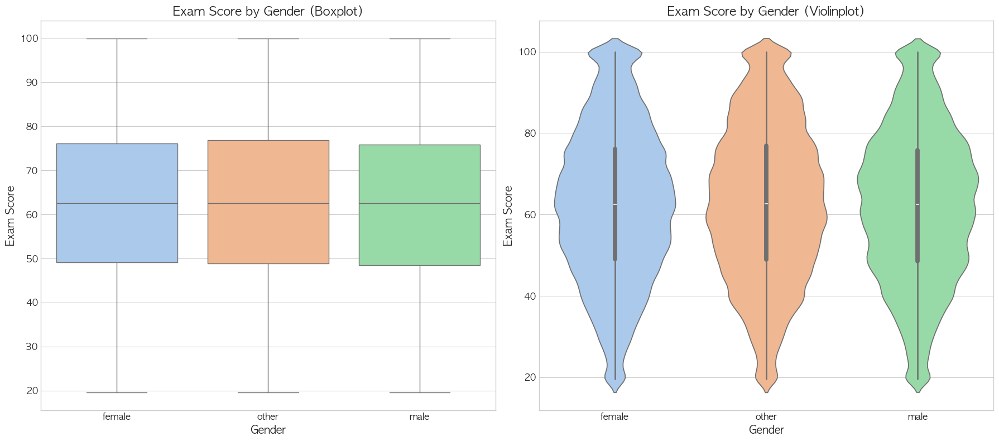

In [41]:
# 그래프 크기 설정
plt.figure(figsize=(18, 8))

# 1. 성별에 따른 성적 분포 (Boxplot)
plt.subplot(1, 2, 1)
sns.boxplot(x='gender', y='exam_score', data=train, palette='pastel')
plt.title('Exam Score by Gender (Boxplot)', fontsize=16, fontweight='bold')
plt.xlabel('Gender', fontsize=14)
plt.ylabel('Exam Score', fontsize=14)
plt.tick_params(labelsize=12)

# 2. 성별에 따른 성적 분포 (Violinplot) - 분포의 밀도까지 확인 가능
plt.subplot(1, 2, 2)
sns.violinplot(x='gender', y='exam_score', data=train, palette='pastel')
plt.title('Exam Score by Gender (Violinplot)', fontsize=16, fontweight='bold')
plt.xlabel('Gender', fontsize=14)
plt.ylabel('Exam Score', fontsize=14)
plt.tick_params(labelsize=12)

plt.tight_layout()
plt.show()

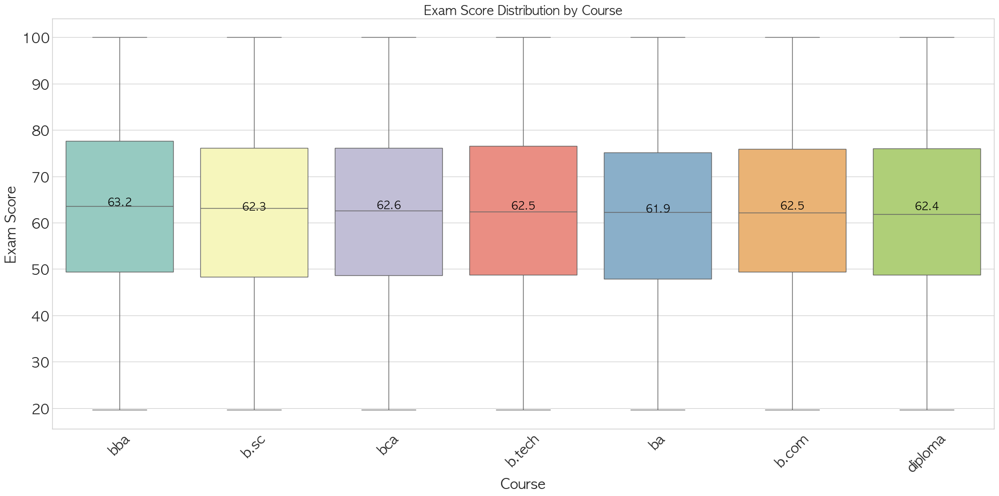

In [42]:
# 그래프 크기 설정 (가로를 넓게 설정)
plt.figure(figsize=(20, 10))

# 과정(course)별 성적 분포 (Boxplot)
# order 파라미터로 성적 중앙값이 높은 순서대로 정렬하면 보기가 더 좋습니다.
course_order = train.groupby('course')['exam_score'].median().sort_values(ascending=False).index

# ax 객체를 저장하여 나중에 활용 (필요시)
ax = sns.boxplot(x='course', y='exam_score', data=train, palette='Set3', order=course_order)

# --- 추가된 부분: 평균값 계산 및 표시 ---
# 각 과정별 평균 점수 계산
course_means = train.groupby('course')['exam_score'].mean()

# 각 박스플롯 위에 평균값 텍스트 추가
for i, course in enumerate(course_order):
    mean_val = course_means[course]
    # x좌표는 i (0부터 시작하는 인덱스), y좌표는 평균값
    plt.text(i, mean_val, f'{mean_val:.1f}', 
             horizontalalignment='center',  # 가로 정렬: 중앙
             verticalalignment='bottom',    # 세로 정렬: 글자 아래쪽이 좌표에 오도록 (박스 위에 표시)
             color='black',                 # 글자 색상
             weight='bold',                 # 글자 굵기
             fontsize=15)                   # 글자 크기
# -------------------------------------

plt.title('Exam Score Distribution by Course', fontsize=18, fontweight='bold')
plt.xlabel('Course', fontsize=20)
plt.ylabel('Exam Score', fontsize=20)
plt.xticks(rotation=45, fontsize=20)  # x축 라벨 45도 회전
plt.yticks(fontsize=20)

plt.tight_layout()
plt.show()

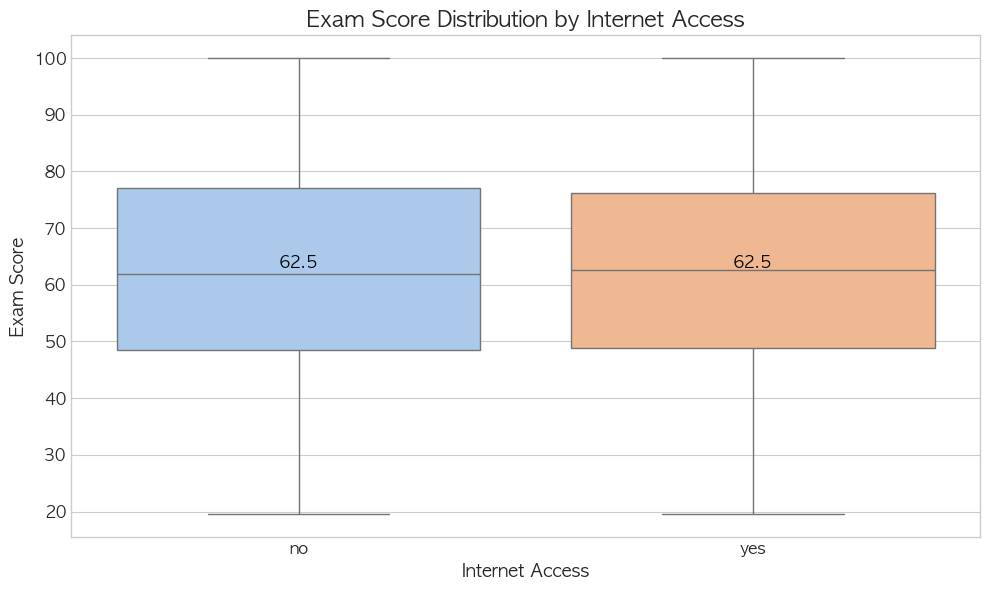

In [43]:
# 그래프 크기 설정 (범주가 2개뿐이므로 가로폭을 적당히 설정)
plt.figure(figsize=(10, 6))

# 인터넷 접속 여부(internet_access)별 성적 분포 시각화 (Boxplot)
# palette='Set2' 등 원하는 색상 테마로 변경 가능합니다.
ax = sns.boxplot(x='internet_access', y='exam_score', data=train, palette='pastel')

# --- 평균값 계산 및 표시 로직 ---
# 인터넷 접속 여부별 평균 점수 계산
internet_access_means = train.groupby('internet_access')['exam_score'].mean()

# 각 박스플롯 위에 평균값 텍스트 추가
# order가 지정되지 않았으므로 기본 정렬(알파벳순: no, yes) 또는 데이터 등장 순서일 수 있습니다.
# 확실하게 하기 위해 ax.get_xticklabels()로 현재 축의 순서를 가져와 매핑합니다.
labels = [label.get_text() for label in ax.get_xticklabels()]

for i, label in enumerate(labels):
    mean_val = internet_access_means[label]
    plt.text(i, mean_val, f'{mean_val:.1f}', 
             horizontalalignment='center',  # 좌우 가운데 정렬
             verticalalignment='bottom',    # 글자 하단을 좌표에 맞춤
             color='black',                 # 글자색
             weight='bold',                 # 글자 굵게
             fontsize=12)                   # 글자 크기
# -----------------------------

# 그래프 제목 및 라벨 설정
plt.title('Exam Score Distribution by Internet Access', fontsize=16, fontweight='bold')
plt.xlabel('Internet Access', fontsize=13)
plt.ylabel('Exam Score', fontsize=13)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)

plt.tight_layout()
plt.show()

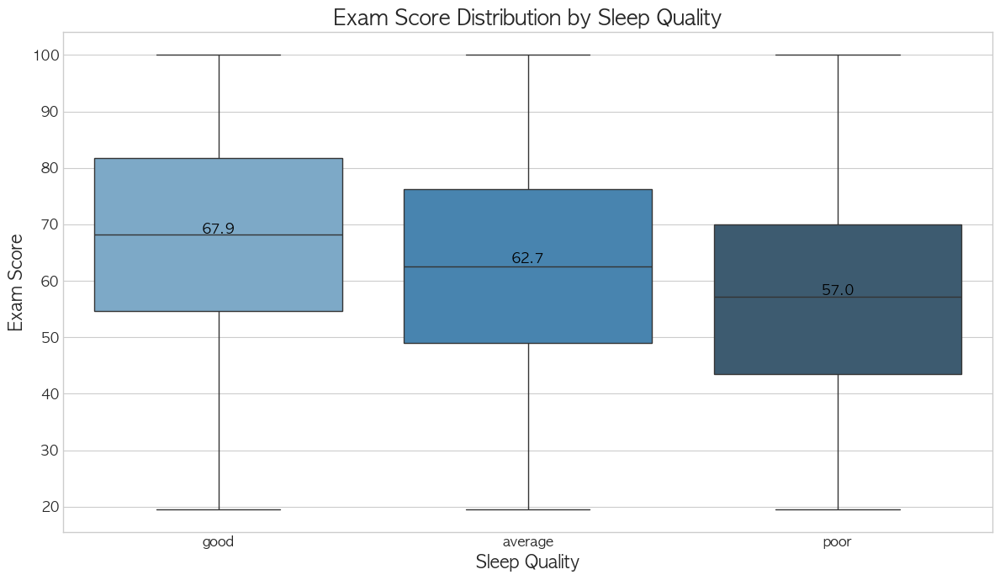

In [44]:
# 그래프 크기 설정
plt.figure(figsize=(12, 7))

# 수면의 질(sleep_quality)별 성적 중앙값을 기준으로 내림차순 정렬
# (성적이 높은 그룹이 왼쪽으로 오도록 설정)
sleep_order = train.groupby('sleep_quality')['exam_score'].median().sort_values(ascending=False).index

# Boxplot 그리기
ax = sns.boxplot(x='sleep_quality', y='exam_score', data=train, 
                 palette='Blues_d',  # 색상 팔레트 설정 (원하는 스타일로 변경 가능)
                 order=sleep_order)

# --- 평균값 계산 및 표시 ---
# 수면의 질 별 평균 점수 계산
sleep_means = train.groupby('sleep_quality')['exam_score'].mean()

# 각 박스플롯 위에 평균값 텍스트 추가
for i, label in enumerate(sleep_order):
    mean_val = sleep_means[label]
    plt.text(i, mean_val, f'{mean_val:.1f}', 
             horizontalalignment='center',
             verticalalignment='bottom',
             color='black',
             weight='bold',
             fontsize=12)
# -------------------------

# 그래프 제목 및 라벨 설정
plt.title('Exam Score Distribution by Sleep Quality', fontsize=18, fontweight='bold')
plt.xlabel('Sleep Quality', fontsize=15)
plt.ylabel('Exam Score', fontsize=15)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)

plt.tight_layout()
plt.show()

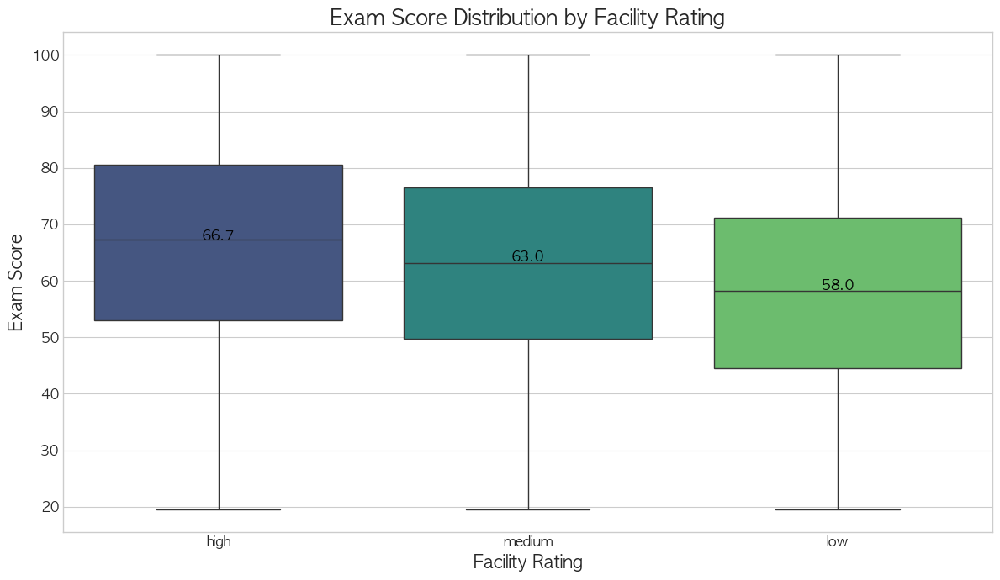

In [45]:
# 그래프 크기 설정
plt.figure(figsize=(12, 7))

# Facility Rating 별 성적 중앙값 기준 내림차순 정렬
# (시설 등급이 성적에 미치는 영향을 순서대로 보기 위함)
facility_order = train.groupby('facility_rating')['exam_score'].median().sort_values(ascending=False).index

# Boxplot 그리기
ax = sns.boxplot(x='facility_rating', y='exam_score', data=train, 
                 palette='viridis',  # 색상 팔레트 변경
                 order=facility_order)

# --- 평균값 계산 및 표시 ---
# Facility Rating 별 평균 점수 계산
facility_means = train.groupby('facility_rating')['exam_score'].mean()

# 각 박스플롯 위에 평균값 텍스트 추가
for i, label in enumerate(facility_order):
    mean_val = facility_means[label]
    plt.text(i, mean_val, f'{mean_val:.1f}', 
             horizontalalignment='center',
             verticalalignment='bottom',
             color='black',
             weight='bold',
             fontsize=12)
# -------------------------

# 그래프 제목 및 라벨 설정
plt.title('Exam Score Distribution by Facility Rating', fontsize=18, fontweight='bold')
plt.xlabel('Facility Rating', fontsize=15)
plt.ylabel('Exam Score', fontsize=15)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)

plt.tight_layout()
plt.show()

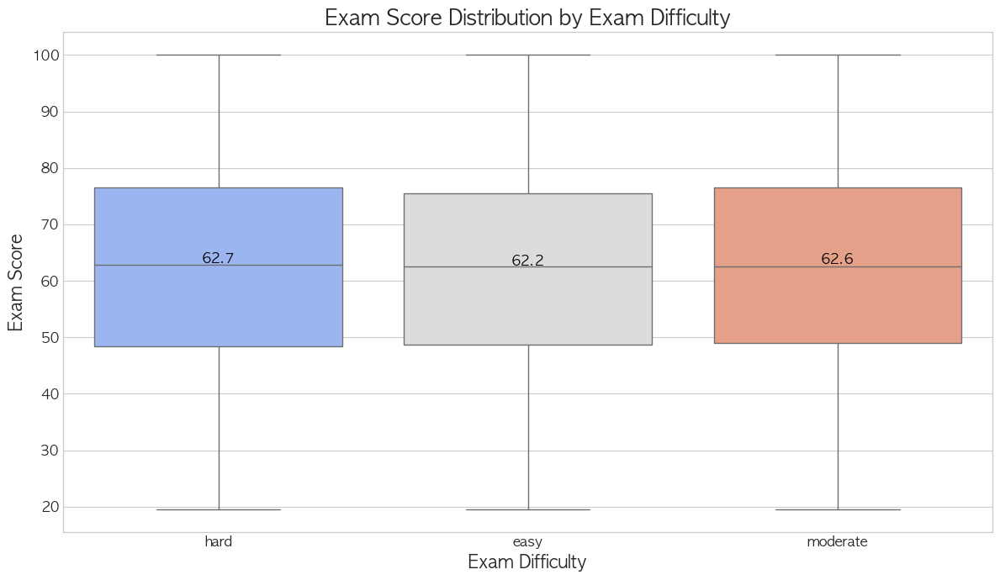

In [46]:
# 그래프 크기 설정
plt.figure(figsize=(12, 7))

# 시험 난이도(exam_difficulty)별 성적 중앙값 기준 내림차순 정렬
# (성적이 높은 순서, 즉 아마도 'easy' -> 'medium' -> 'hard' 순으로 정렬될 가능성이 높음)
difficulty_order = train.groupby('exam_difficulty')['exam_score'].median().sort_values(ascending=False).index

# Boxplot 그리기
ax = sns.boxplot(x='exam_difficulty', y='exam_score', data=train, 
                 palette='coolwarm',  # 난이도 느낌을 살리기 위해 coolwarm 팔레트 사용
                 order=difficulty_order)

# --- 평균값 계산 및 표시 ---
# 시험 난이도별 평균 점수 계산
difficulty_means = train.groupby('exam_difficulty')['exam_score'].mean()

# 각 박스플롯 위에 평균값 텍스트 추가
for i, label in enumerate(difficulty_order):
    mean_val = difficulty_means[label]
    plt.text(i, mean_val, f'{mean_val:.1f}', 
             horizontalalignment='center',
             verticalalignment='bottom',
             color='black',
             weight='bold',
             fontsize=12)
# -------------------------

# 그래프 제목 및 라벨 설정
plt.title('Exam Score Distribution by Exam Difficulty', fontsize=18, fontweight='bold')
plt.xlabel('Exam Difficulty', fontsize=15)
plt.ylabel('Exam Score', fontsize=15)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)

plt.tight_layout()
plt.show()

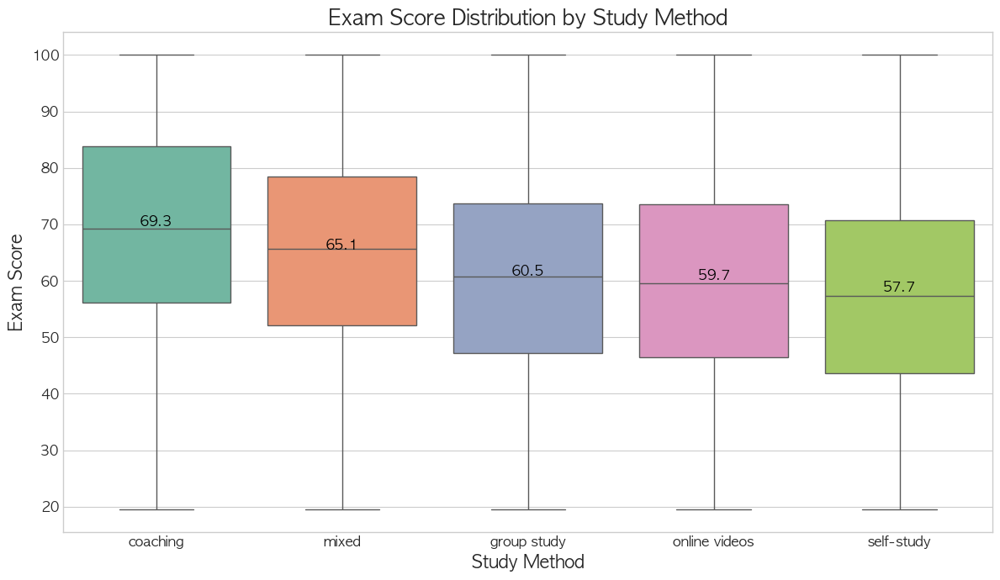

In [47]:
# 그래프 크기 설정
plt.figure(figsize=(12, 7))

# 공부 방법(study_method)별 성적 중앙값을 기준으로 내림차순 정렬
method_order = train.groupby('study_method')['exam_score'].median().sort_values(ascending=False).index

# Boxplot 그리기
# 공부 방법은 색상 구분이 잘 되도록 'Set2' 팔레트 사용
ax = sns.boxplot(x='study_method', y='exam_score', data=train, 
                 palette='Set2', 
                 order=method_order)

# --- 평균값 계산 및 표시 ---
# 공부 방법별 평균 점수 계산
method_means = train.groupby('study_method')['exam_score'].mean()

# 각 박스플롯 위에 평균값 텍스트 추가
for i, label in enumerate(method_order):
    mean_val = method_means[label]
    plt.text(i, mean_val, f'{mean_val:.1f}', 
             horizontalalignment='center',
             verticalalignment='bottom',
             color='black',
             weight='bold',
             fontsize=12)
# -------------------------

# 그래프 제목 및 라벨 설정
plt.title('Exam Score Distribution by Study Method', fontsize=18, fontweight='bold')
plt.xlabel('Study Method', fontsize=15)
plt.ylabel('Exam Score', fontsize=15)
plt.xticks(fontsize=12) # x축 라벨 폰트 크기
plt.yticks(fontsize=12)

plt.tight_layout()
plt.show()

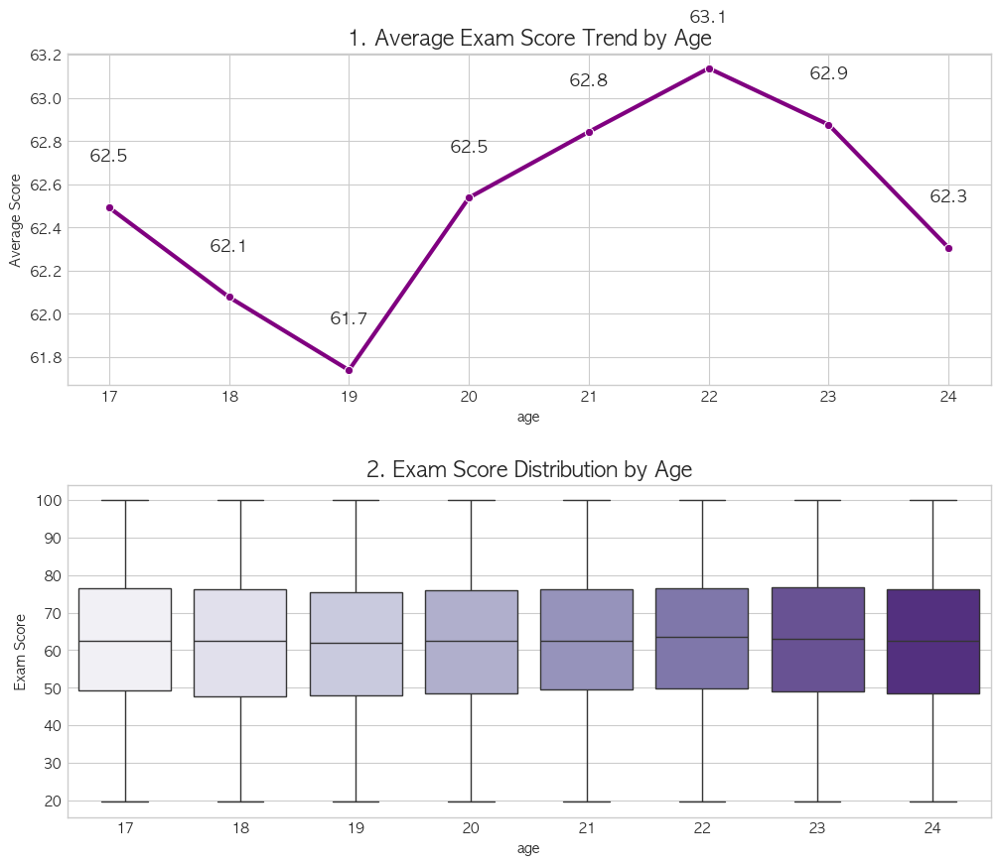

In [77]:
# 2. 그래프 설정 (2개를 위아래로 배치)
fig, axes = plt.subplots(2, 1, figsize=(12, 10))
plt.subplots_adjust(hspace=0.3) # 그래프 간격 조절

# 📈 첫 번째: 평균 점수의 흐름 (Line Plot)
# 설명: 나이별로 점수가 어떻게 변하는지 선으로 봅니다.
sns.lineplot(data=df, x='age', y='exam_score', 
             marker='o', color='purple', linewidth=3, errorbar=None, ax=axes[0])

axes[0].set_title('1. Average Exam Score Trend by Age', fontsize=15, fontweight='bold')
axes[0].set_ylabel('Average Score')
axes[0].set_xticks(range(17, 25)) # 17~24세 x축 고정

# 평균 점수 숫자 표시 (친절하게)
age_means = df.groupby('age')['exam_score'].mean()
for age, score in age_means.items():
    axes[0].text(age, score + 0.2, f'{score:.1f}', 
                 ha='center', va='bottom', fontweight='bold', fontsize=12)

# 📦 두 번째: 점수 분포 박스 플롯 (Box Plot)
# 설명: 각 나이대별로 점수가 어떻게 퍼져 있는지 봅니다. (100점과 0점이 어디에 많은지)
sns.boxplot(data=df, x='age', y='exam_score', palette='Purples', ax=axes[1])

axes[1].set_title('2. Exam Score Distribution by Age', fontsize=15, fontweight='bold')
axes[1].set_ylabel('Exam Score')

plt.show()

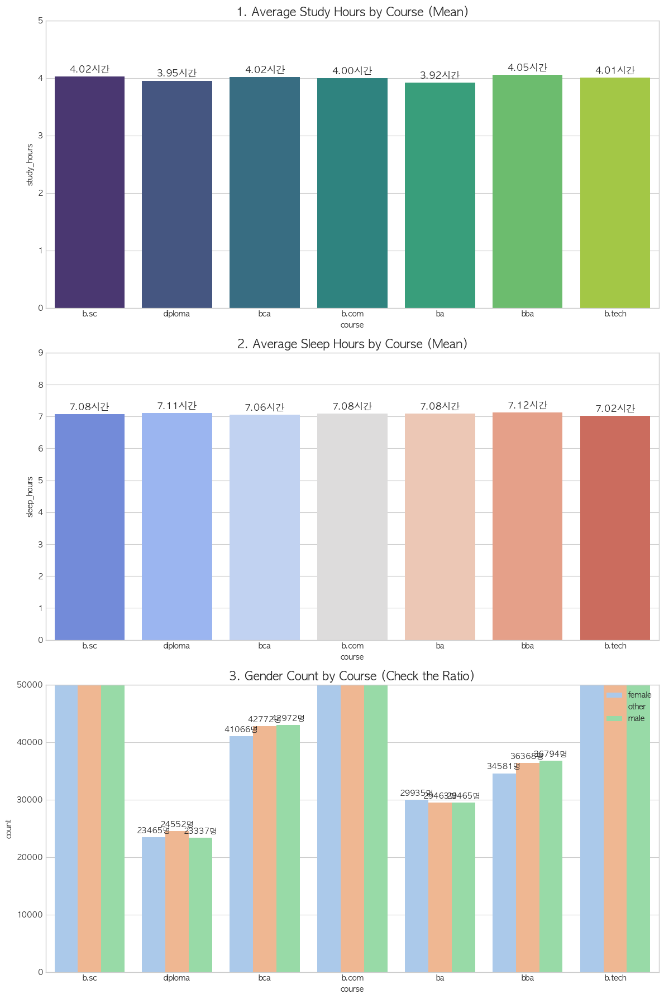

In [82]:
# 2. 그래프 설정 (3단 콤보)
fig, axes = plt.subplots(3, 1, figsize=(12, 18))
plt.subplots_adjust(hspace=0.4) # 간격 조정

# -------------------------------------------------------
# 📚 1. 전공별 '평균' 공부 시간 (숫자 표시)
# -------------------------------------------------------
ax1 = sns.barplot(data=df, x='course', y='study_hours', estimator='mean', errorbar=None, palette='viridis', ax=axes[0])
axes[0].set_title('1. Average Study Hours by Course (Mean)', fontsize=15, fontweight='bold')
axes[0].set_ylim(0, 5) # 여백 확보

# ★ 핵심: 막대 위에 숫자 쓰기
for container in ax1.containers:
    ax1.bar_label(container, fmt='%.2f시간', padding=3, fontsize=12, fontweight='bold')


# -------------------------------------------------------
# 🛌 2. 전공별 '평균' 수면 시간 (숫자 표시)
# -------------------------------------------------------
ax2 = sns.barplot(data=df, x='course', y='sleep_hours', estimator='mean', errorbar=None, palette='coolwarm', ax=axes[1])
axes[1].set_title('2. Average Sleep Hours by Course (Mean)', fontsize=15, fontweight='bold')
axes[1].set_ylim(0, 9) # 여백 확보

# ★ 핵심: 막대 위에 숫자 쓰기
for container in ax2.containers:
    ax2.bar_label(container, fmt='%.2f시간', padding=3, fontsize=12, fontweight='bold')


# -------------------------------------------------------
# 👫 3. 전공별 성별 '인원수' (숫자 표시)
# -------------------------------------------------------
ax3 = sns.countplot(data=df, x='course', hue='gender', palette='pastel', ax=axes[2])
axes[2].set_title('3. Gender Count by Course (Check the Ratio)', fontsize=15, fontweight='bold')
axes[2].legend(loc='upper right')
axes[2].set_ylim(0, 50000) # 여백 확보 (데이터 양에 따라 조절 필요할 수 있음)

# ★ 핵심: 막대 위에 숫자 쓰기
for container in ax3.containers:
    ax3.bar_label(container, fmt='%d명', padding=3, fontsize=10)

plt.tight_layout()
plt.show()

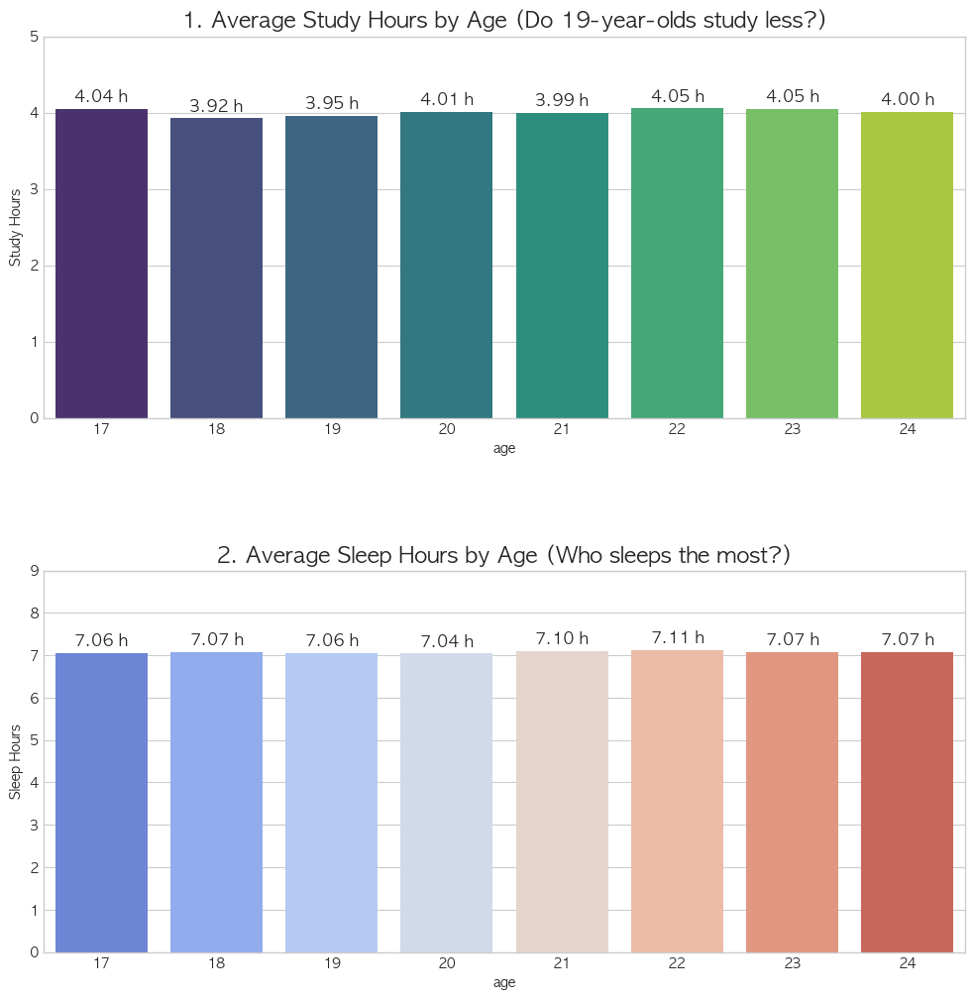

In [84]:
import matplotlib.pyplot as plt
import seaborn as sns

# 1. 그래프 틀 잡기 (위아래로 2개)
fig, axes = plt.subplots(2, 1, figsize=(12, 12))
plt.subplots_adjust(hspace=0.4) # 그래프 사이 간격 넓히기

# -------------------------------------------------------
# 📚 1. 나이별 평균 공부 시간 (Study Hours)
# -------------------------------------------------------
# estimator='mean': 평균값을 구해서 그려라
ax1 = sns.barplot(data=df, x='age', y='study_hours', estimator='mean', errorbar=None, palette='viridis', ax=axes[0])

axes[0].set_title('1. Average Study Hours by Age (Do 19-year-olds study less?)', fontsize=16, fontweight='bold')
axes[0].set_ylabel('Study Hours')
axes[0].set_ylim(0, 5) # 텍스트 들어갈 여백 확보

# ★ 핵심: 막대 위에 숫자(평균 공부시간) 적어주기
# fmt='%.2f': 소수점 둘째 자리까지 표시 (예: 3.95)
for container in ax1.containers:
    ax1.bar_label(container, fmt='%.2f h', padding=3, fontsize=12, fontweight='bold')


# -------------------------------------------------------
# 🛌 2. 나이별 평균 수면 시간 (Sleep Hours)
# -------------------------------------------------------
ax2 = sns.barplot(data=df, x='age', y='sleep_hours', estimator='mean', errorbar=None, palette='coolwarm', ax=axes[1])

axes[1].set_title('2. Average Sleep Hours by Age (Who sleeps the most?)', fontsize=16, fontweight='bold')
axes[1].set_ylabel('Sleep Hours')
axes[1].set_ylim(0, 9) # 여백 확보

# ★ 핵심: 막대 위에 숫자(평균 수면시간) 적어주기
for container in ax2.containers:
    ax2.bar_label(container, fmt='%.2f h', padding=3, fontsize=12, fontweight='bold')

plt.show()

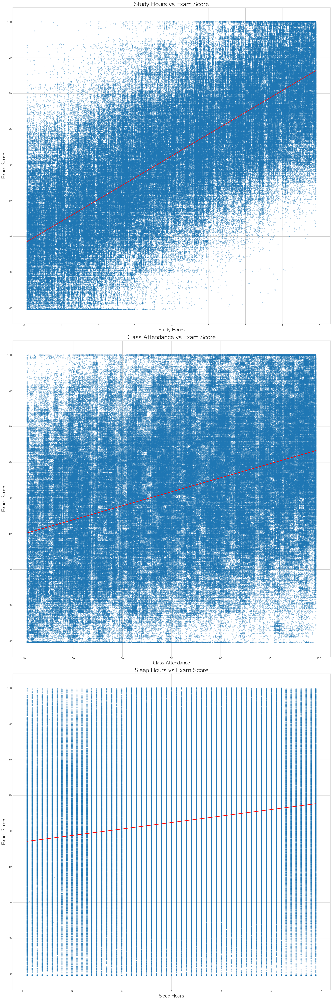

In [48]:
# 1행 3열의 서브플롯 생성 (가로로 길게 배치)
fig, axes = plt.subplots(3, 1, figsize=(20, 60))

# 시각화할 변수 리스트
cols = ['study_hours', 'class_attendance', 'sleep_hours']
titles = ['Study Hours vs Exam Score', 'Class Attendance vs Exam Score', 'Sleep Hours vs Exam Score']
colors = ['blue', 'green', 'purple']  # 각 그래프의 색상 다르게 설정

# 반복문을 통해 3개의 그래프 그리기
for i, col in enumerate(cols):
    # regplot: 산점도와 회귀선을 함께 그림 (데이터가 많으므로 점 크기와 투명도 조절 권장)
    sns.regplot(x=col, y='exam_score', data=train, ax=axes[i], 
                scatter_kws={'alpha':0.3, 's':10},  # 점 투명도(alpha)와 크기(s) 조절
                line_kws={'color':'red'})           # 회귀선 색상 (빨간색)
    
    axes[i].set_title(titles[i], fontsize=25, fontweight='bold')
    axes[i].set_xlabel(col.replace('_', ' ').title(), fontsize=20)
    axes[i].set_ylabel('Exam Score', fontsize=20)

plt.tight_layout()
plt.show()

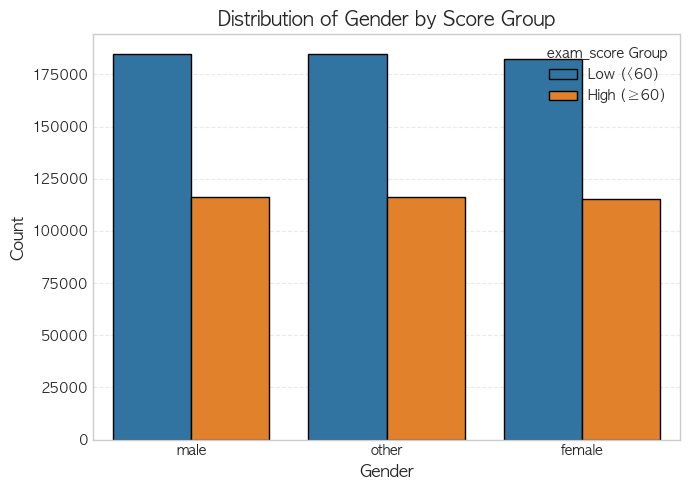

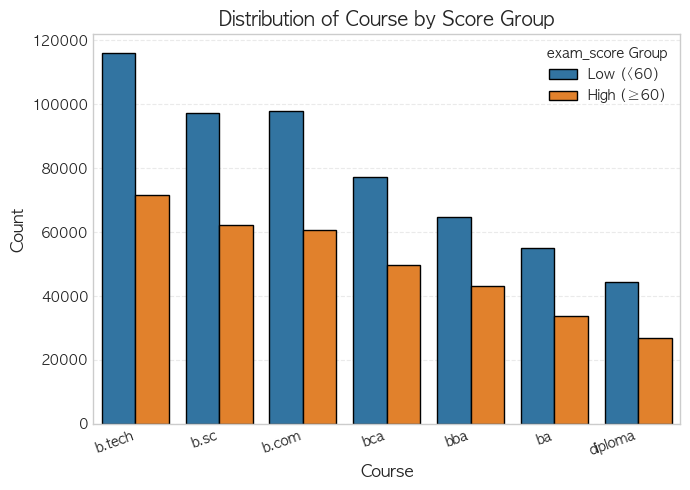

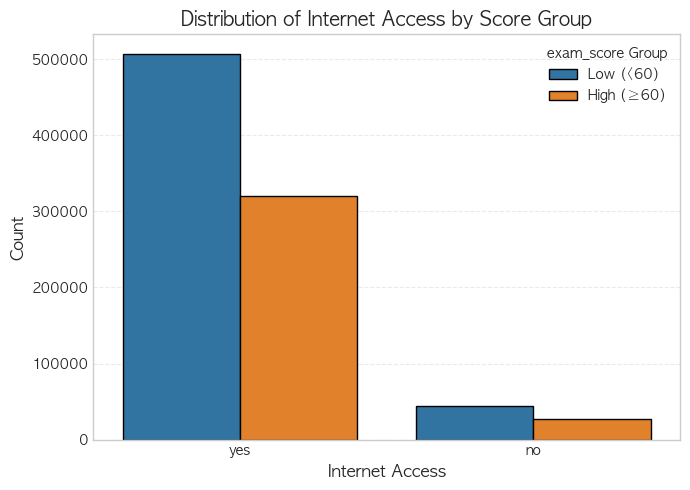

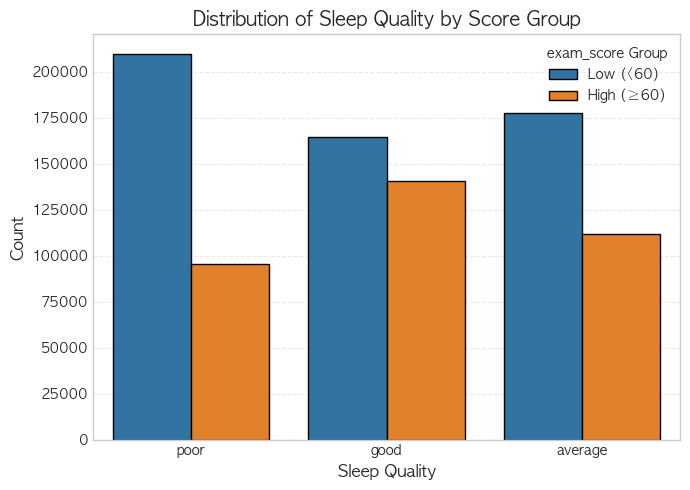

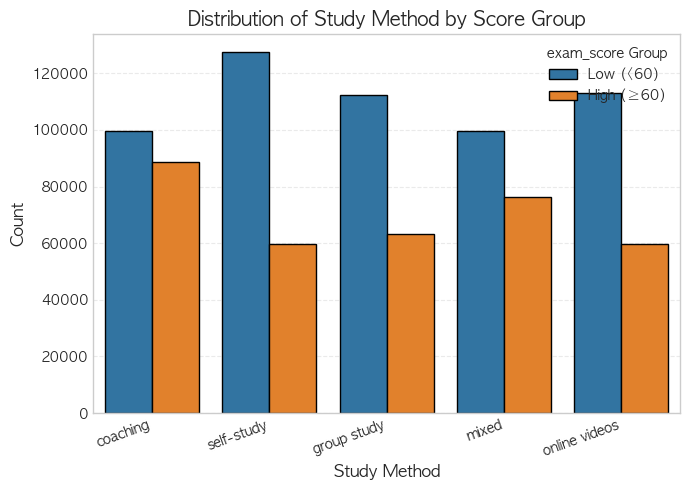

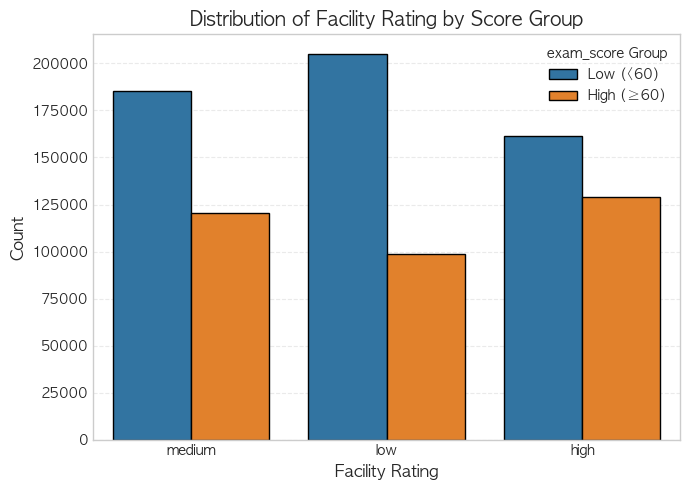

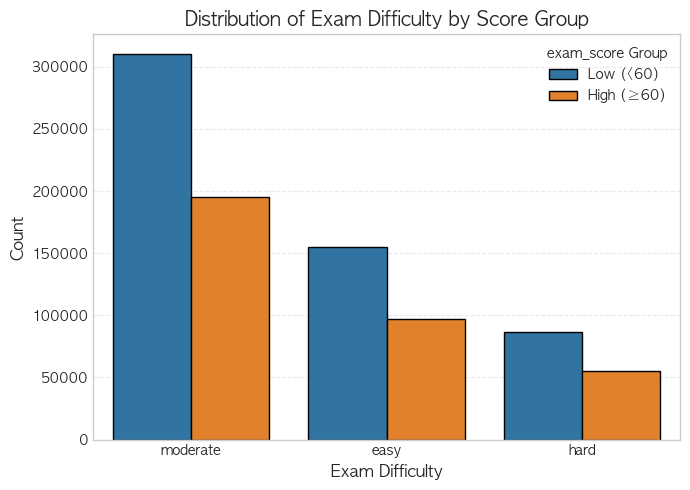

In [49]:
SCORE_COL = "exam_score"
THRESHOLD = 60                      # >= 60 -> 1 (High), < 60 -> 0 (Low)
TARGET_COL = "high_score_flag"      # new binary target name

cols_to_plot = [
    "gender",
    "course",
    "internet_access",
    "sleep_quality",
    "study_method",
    "facility_rating",
    "exam_difficulty"
]

custom_palette = ['#1F77B4', '#FF7F0E']  # 0 (Low), 1 (High)


#  Create binary target (train rows have exam_score, test rows are NaN)

df[TARGET_COL] = (df[SCORE_COL] >= THRESHOLD).astype("Int64")  # keeps NaN for missing scores

# Optional: plot only rows where the target exists (recommended)
plot_df = df.dropna(subset=[TARGET_COL]).copy()
#  Categorical Feature Distributions by Target
for col in cols_to_plot:
    plt.figure(figsize=(7, 5))

    sns.countplot(
        data=plot_df,
        x=col,
        hue=TARGET_COL,
        palette=custom_palette,
        edgecolor='black',
        order=plot_df[col].value_counts().index
    )

    plt.title(f'Distribution of {col.replace("_"," ").title()} by Score Group', fontsize=14)
    plt.xlabel(col.replace("_"," ").title(), fontsize=12)
    plt.ylabel('Count', fontsize=12)

    # Rotate if many/long categories
    if plot_df[col].nunique(dropna=True) > 4:
        plt.xticks(rotation=20, ha='right')

    plt.legend(
        title=f'{SCORE_COL} Group',
        labels=[f'Low (<{THRESHOLD})', f'High (≥{THRESHOLD})']
    )

    plt.grid(axis='y', linestyle='--', alpha=0.4)
    plt.tight_layout()
    plt.show()


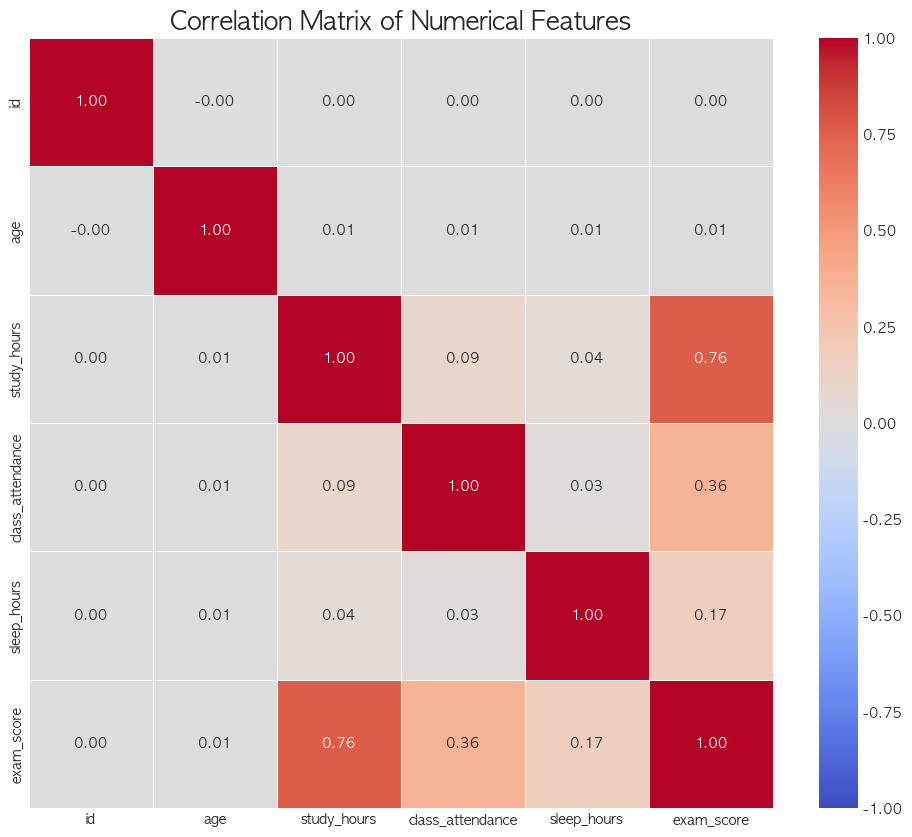

In [50]:
# 그래프 크기 설정
plt.figure(figsize=(12, 10))

# 수치형 컬럼만 선택하여 상관계수 계산
numeric_train = train.select_dtypes(include=[np.number])
correlation_matrix = numeric_train.corr()

# 상관계수 히트맵 그리기
# annot=True: 칸 안에 수치 표시, fmt='.2f': 소수점 둘째 자리까지, cmap='coolwarm': 색상 테마
sns.heatmap(correlation_matrix, annot=True, fmt='.2f', cmap='coolwarm', linewidths=0.5, vmin=-1, vmax=1)

plt.title('Correlation Matrix of Numerical Features', fontsize=18, fontweight='bold')
plt.show()

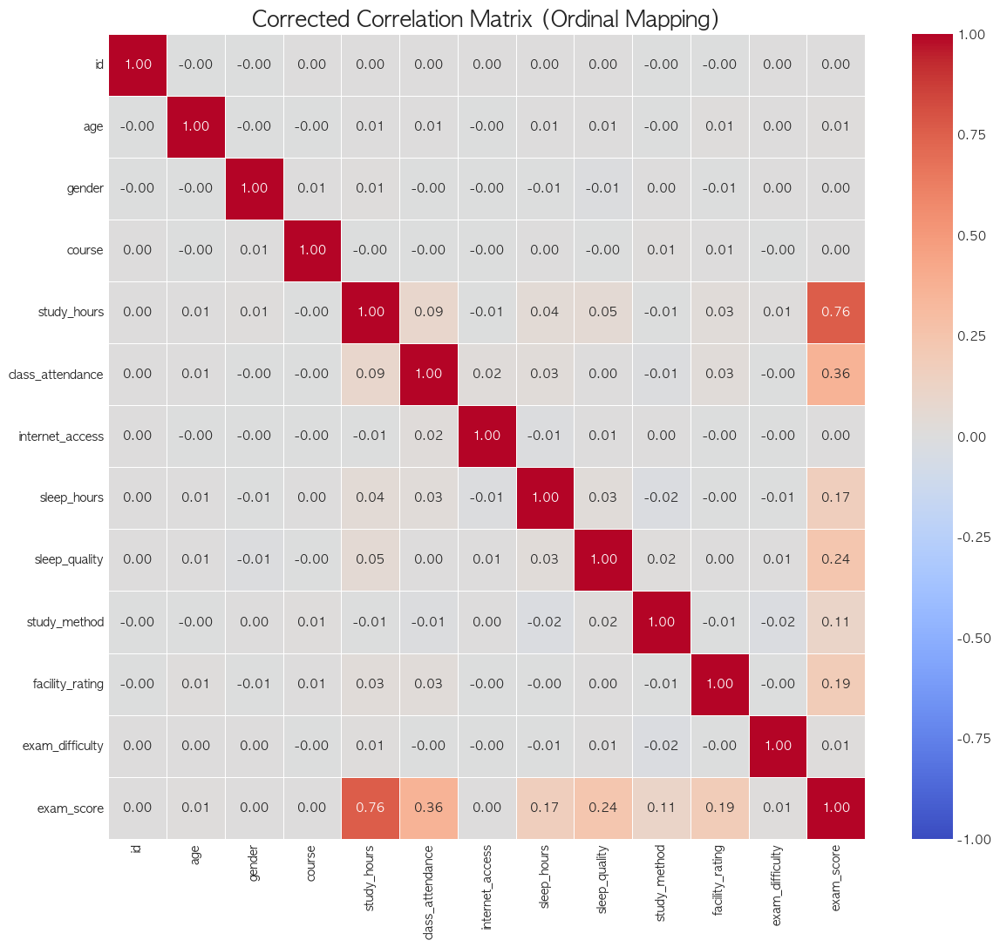

In [52]:
# 순서가 있는 변수들에 대해 직접 매핑(Mapping) 수행
# 실제 데이터의 값(value)을 확인하고 순서(0, 1, 2...)를 부여해야 합니다.
# 예시: Low=0, Medium=1, High=2 (숫자가 커질수록 긍정적/높음)

mapping_rules = {
    'facility_rating': {'low': 0, 'medium': 1, 'high': 2},
    'sleep_quality': {'poor': 0, 'average': 1, 'good': 2},
    'internet_access': {'no': 0, 'yes': 1},
    'exam_difficulty': {'easy': 0, 'moderate': 1, 'hard': 2},
    'study_method':{'self_study':0,'online_videos':1,'group_study':2,'mixed':3,'coaching':4}
    # 난이도는 hard가 점수가 낮을 수 있으니 역순(2,1,0)으로 배치해보거나, 
    # 일단 크기순(0,1,2)으로 한 뒤 상관계수가 음수가 나오는지 확인하는 것이 좋습니다.
}

# 데이터 복사
train_mapped = train.copy()

# 매핑 적용 (매핑 규칙에 없는 값은 NaN이 될 수 있으니 주의, 여기서는 예시입니다)
for col, rules in mapping_rules.items():
    if col in train_mapped.columns:
        train_mapped[col] = train_mapped[col].map(rules)

# 나머지 문자열 컬럼(순서가 딱히 없는 course, gender 등)은 기존 방식대로 Label Encoding
le = LabelEncoder()
other_categorical = [c for c in train_mapped.select_dtypes(include=['object']).columns]

for col in other_categorical:
    train_mapped[col] = le.fit_transform(train_mapped[col])

# 상관계수 재계산
corr_matrix_mapped = train_mapped.corr()

# 히트맵 그리기
plt.figure(figsize=(14, 12))
sns.heatmap(corr_matrix_mapped, annot=True, fmt='.2f', cmap='coolwarm', linewidths=0.5, vmin=-1, vmax=1)
plt.title('Corrected Correlation Matrix (Ordinal Mapping)', fontsize=18, fontweight='bold')
plt.show()

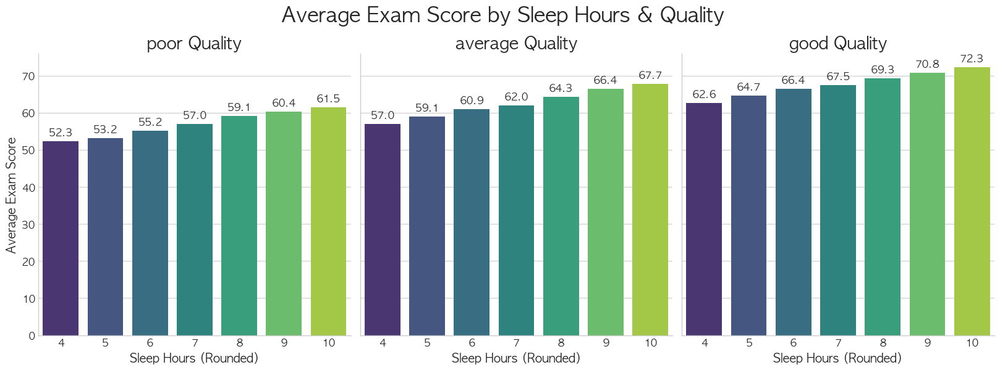

In [58]:
# 1. 수면 시간 정수화 (이미 했다면 생략 가능)
train['sleep_hours_int'] = train['sleep_hours'].round().astype(int)

# 2. 순서 지정: poor -> average -> good
quality_order = ['poor', 'average', 'good']

# 3. 막대그래프 그리기
g = sns.catplot(x='sleep_hours_int', y='exam_score', 
                col='sleep_quality', kind='bar', 
                data=train, palette='viridis', height=6, aspect=0.9,
                col_order=quality_order,  # ★ 순서 지정 
                ci=None) # 신뢰구간 제거

# 4. 전체 제목 및 소제목 스타일링
g.fig.subplots_adjust(top=0.85)
g.fig.suptitle('Average Exam Score by Sleep Hours & Quality', fontsize=24, fontweight='bold')

# ★ 소제목 폰트 크기 키우기 (size=20)
g.set_titles(col_template="{col_name} Quality", size=20, fontweight='bold')

g.set_axis_labels("Sleep Hours (Rounded)", "Average Exam Score", fontsize=14)

# 5. 각 막대 위에 평균 점수 표시
for ax in g.axes.flat:
    # y축 눈금 폰트도 살짝 키우기
    ax.tick_params(labelsize=12)
    
    for p in ax.patches:
        if p.get_height() > 0:
            ax.text(p.get_x() + p.get_width() / 2., p.get_height() + 1, 
                    f'{p.get_height():.1f}', 
                    ha='center', va='bottom', fontsize=12, weight='bold')

plt.show()

In [64]:
# 조건에 맞는 데이터 필터링
# 1. study_method 컬럼에 'Online'이라는 단어가 포함되어 있거나 정확히 'Online'인 경우
# (데이터에 따라 'Online', 'online', 'Online Videos' 등으로 적혀있을 수 있으므로 확인 필요)
# 여기서는 가장 일반적인 경우를 가정하고 코드를 작성합니다.

# 값 확인용 (실행 후 주석 처리 가능)
print("Study Method Unique Values:", train['study_method'].unique())
print("Internet Access Unique Values:", train['internet_access'].unique())

# 조건 필터링
target_students = train[
    (train['study_method'] == 'online videos') &  # 실제 데이터 값에 맞춰 수정 필요할 수 있음 (예: 'Online Videos')
    (train['internet_access'] == 'no')     # 실제 데이터 값 (예: 'no', 'No')
]

# 인원수 카운트
count = len(target_students)

print(f"Study Method가 'Online'이면서 Internet Access가 'No'인 학생 수: {count}명")

# 만약 데이터가 있다면 해당 데이터 샘플 출력해보기
if count > 0:
    display(target_students.head())

Study Method Unique Values: ['online videos' 'self-study' 'coaching' 'group study' 'mixed']
Internet Access Unique Values: ['no' 'yes']
Study Method가 'Online'이면서 Internet Access가 'No'인 학생 수: 8730명


,id,age,gender,course,study_hours,class_attendance,internet_access,sleep_hours,sleep_quality,study_method,facility_rating,exam_difficulty,exam_score,sleep_hours_int,attendance_study,interaction_bin
0,0,21,female,b.sc,7.91,98.8,no,4.9,average,online videos,low,easy,78.300,5,781.508,"(770.594, 786.254]"
151,151,17,female,diploma,0.08,57.2,no,4.2,average,online videos,medium,hard,19.599,4,4.576,"(2.465, 18.908]"
248,248,19,female,b.com,7.72,92.1,no,9.5,good,online videos,high,easy,86.800,10,711.012,"(707.953, 723.614]"
369,369,21,male,bca,3.76,97.1,no,6.2,good,online videos,low,easy,63.400,6,365.096,"(363.431, 379.091]"
407,407,21,other,b.tech,4.23,47.0,no,5.5,good,online videos,medium,easy,53.400,6,198.810,"(191.169, 206.83]"


In [67]:
# 2. '인터넷 강의(Online Videos)'로 공부하는 학생들만 뽑기
online_study_group = df[df['study_method'] == 'online videos']

# 3. 그 중에서 '인터넷 유무'에 따라 평균 점수 계산하기
# groupby를 쓰면 그룹별로 묶어서 계산해줍니다.
result = online_study_group.groupby('internet_access')['exam_score'].mean()

# 4. 보기 좋게 출력
print("=== [인강 파] 인터넷 유무에 따른 성적 차이 ===")
print(f"📡 인터넷 있음 (Yes): 평균 {result['yes']:.2f}점")
print(f"📵 인터넷 없음 (No) : 평균 {result['no']:.2f}점")

# 5. 점수 차이 계산
diff = result['yes'] - result['no']
print(f"---------------------------------------")
print(f"💡 결론: 와이파이 찾아다니는 고생이 성적을 {diff:.2f}점 깎아먹음!")

=== [인강 파] 인터넷 유무에 따른 성적 차이 ===
📡 인터넷 있음 (Yes): 평균 59.78점
📵 인터넷 없음 (No) : 평균 59.11점
---------------------------------------
💡 결론: 와이파이 찾아다니는 고생이 성적을 0.66점 깎아먹음!


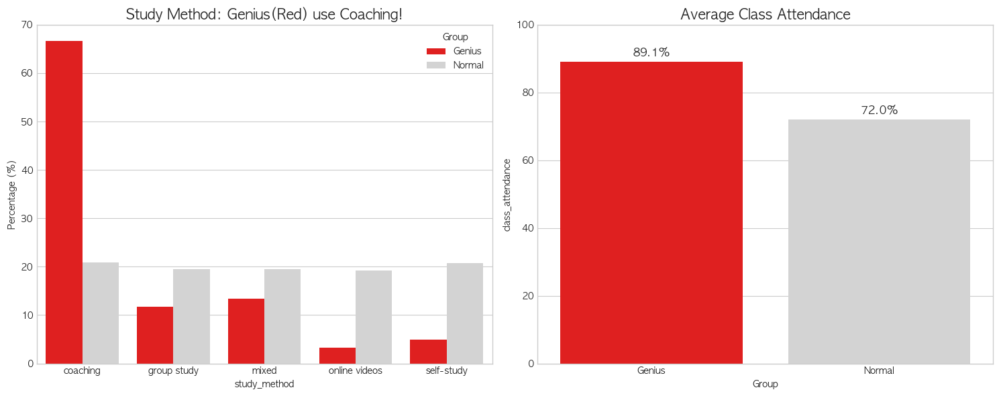

In [68]:
# 2. '천재(Genius)' 그룹과 '일반(Normal)' 그룹 정의하기
# 조건: 공부 시간 2시간 미만인데 점수는 90점 이상
genius_condition = (df['study_hours'] < 2) & (df['exam_score'] > 90)

df['Group'] = 'Normal'  # 일단 다 일반 학생으로 설정
df.loc[genius_condition, 'Group'] = 'Genius'  # 조건 맞는 애들만 '천재'로 변경

# --- 그래프 그리기 설정 ---
fig, axes = plt.subplots(1, 2, figsize=(15, 6)) # 캔버스 2개 준비 (가로로)

# 📊 1. 공부 방법 비교 (Bar Chart)
# 그룹별로 공부 방법 비율 계산
method_counts = df.groupby(['Group', 'study_method']).size().reset_index(name='count')
total_counts = df.groupby('Group').size().reset_index(name='total')
method_data = method_counts.merge(total_counts, on='Group')
method_data['percentage'] = (method_data['count'] / method_data['total']) * 100

sns.barplot(
    data=method_data, 
    x='study_method', 
    y='percentage', 
    hue='Group', 
    palette={'Genius': 'red', 'Normal': 'lightgray'}, # 천재는 빨강, 일반은 회색
    ax=axes[0]
)
axes[0].set_title("Study Method: Genius(Red) use Coaching!", fontsize=15, fontweight='bold')
axes[0].set_ylabel("Percentage (%)")

# 📊 2. 출석률 비교 (Bar Chart)
# 그룹별 평균 출석률 계산
attendance_data = df.groupby('Group')['class_attendance'].mean().reset_index()

sns.barplot(
    data=attendance_data, 
    x='Group', 
    y='class_attendance', 
    palette={'Genius': 'red', 'Normal': 'lightgray'},
    ax=axes[1]
)
axes[1].set_title("Average Class Attendance", fontsize=15, fontweight='bold')
axes[1].set_ylim(0, 100) # 0~100% 범위

# 수치 텍스트 추가 (친절하게)
for p in axes[1].patches:
    axes[1].annotate(f'{p.get_height():.1f}%', 
                     (p.get_x() + p.get_width() / 2., p.get_height()), 
                     ha = 'center', va = 'center', 
                     xytext = (0, 10), textcoords = 'offset points', 
                     fontsize=12, fontweight='bold')

plt.tight_layout()
plt.show() # 결과 짠!

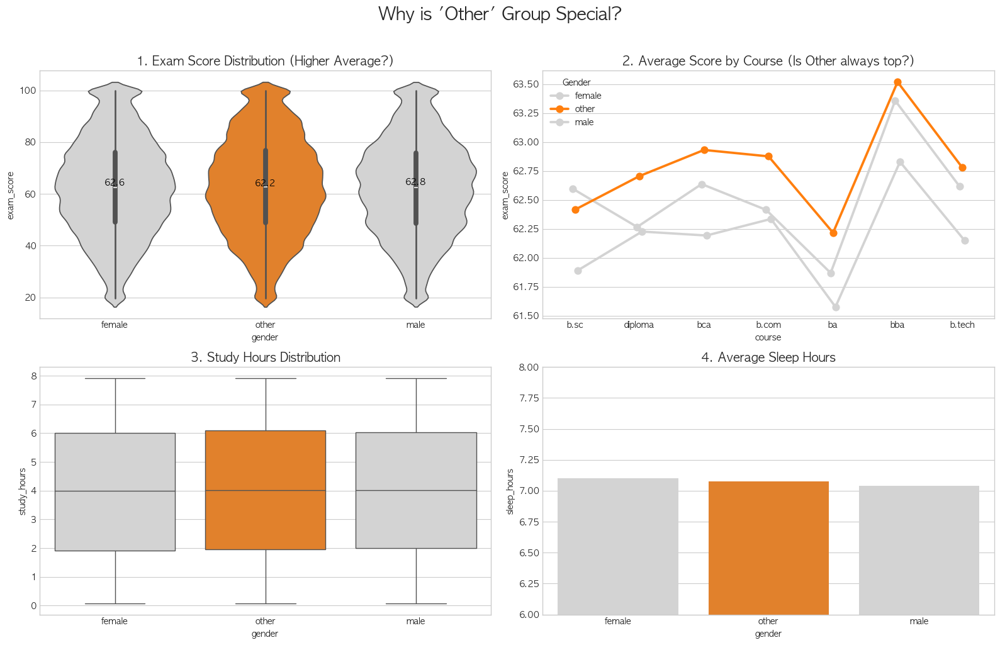

In [70]:
# 2. 'Other' 강조용 컬러 팔레트 만들기 🎨
# Male, Female은 회색(lightgray), Other는 눈에 띄는 오렌지색(#ff7f0e)
custom_palette = {'male': 'lightgray', 'female': 'lightgray', 'other': '#ff7f0e'}

# 3. 그래프 그리기 (2행 2열 구조)
fig, axes = plt.subplots(2, 2, figsize=(16, 10))
plt.subplots_adjust(hspace=0.3) # 그래프 간격 조정

# 📊 1. 성적 분포 비교 (Violin Plot)
# 설명: Other 그룹의 뚱뚱한 부분(평균)이 더 위에 있는지 확인
sns.violinplot(data=df, x='gender', y='exam_score', palette=custom_palette, ax=axes[0, 0])
axes[0, 0].set_title('1. Exam Score Distribution (Higher Average?)', fontsize=14, fontweight='bold')
# 평균선 추가
mean_scores = df.groupby('gender')['exam_score'].mean()
for i, gender in enumerate(['female', 'male', 'other']): # 순서 주의 (violinplot 기본 순서 확인 필요하나 보통 알파벳순/데이터순)
    # 안전하게 gender 값으로 매핑
    val = mean_scores[gender]
    axes[0, 0].text(i, val, f'{val:.1f}', ha='center', va='bottom', fontweight='bold', color='black')


# 📊 2. 전공(Course)별 성적 비교 (Point Plot)
# 설명: 모든 전공에서 주황색 점(Other)이 제일 위에 찍히는지 확인
sns.pointplot(data=df, x='course', y='exam_score', hue='gender', 
              palette=custom_palette, dodge=True, errorbar=None, ax=axes[0, 1])
axes[0, 1].set_title('2. Average Score by Course (Is Other always top?)', fontsize=14, fontweight='bold')
axes[0, 1].legend(title='Gender')


# 📊 3. 공부 시간 비교 (Box Plot)
# 설명: 점수가 높은 게 공부를 더 많이 해서인지 확인 (박스 위치 비교)
sns.boxplot(data=df, x='gender', y='study_hours', palette=custom_palette, ax=axes[1, 0])
axes[1, 0].set_title('3. Study Hours Distribution', fontsize=14, fontweight='bold')


# 📊 4. 수면 효율 비교 (Bar Plot)
# 설명: 잠은 얼마나 자는지 비교
sns.barplot(data=df, x='gender', y='sleep_hours', palette=custom_palette, errorbar=None, ax=axes[1, 1])
axes[1, 1].set_title('4. Average Sleep Hours', fontsize=14, fontweight='bold')
axes[1, 1].set_ylim(6, 8) # 차이를 잘 보여주기 위해 y축 범위 조절

# 전체 제목
plt.suptitle("Why is 'Other' Group Special?", fontsize=20, fontweight='bold', y=1.02)
plt.tight_layout()
plt.show()

In [ ]:
# [코드] '만점자 여부'를 나타내는 새로운 컬럼 추가
#df['is_perfect_score'] = (df['exam_score'] == 100).astype(int)

In [ ]:
import pandas as pd

# 1. 순서가 있는 변수는 숫자로 먼저 바꿔줍니다. (Mapping)
# 이유: 곱하기 연산을 하려면 숫자가 필요하니까요.
mapping_dict = {
    'poor': 1, 'average': 2, 'good': 3,       # 수면 질
    'low': 1, 'medium': 2, 'high': 3,         # 시설 등급
    'easy': 1, 'moderate': 2, 'hard': 3       # 시험 난이도 (일단 바꿉니다)
}

# 함수로 만들어서 train, test 둘 다 한 번에 적용하세요
def create_features(df):
    df = df.copy() # 원본 보호
    
    # (1) 기본 맵핑 적용
    df['sleep_quality_num'] = df['sleep_quality'].map(mapping_dict)
    df['facility_rating_num'] = df['facility_rating'].map(mapping_dict)
    
    # ---------------------------------------------------------
    # 🚀 핵심 파생변수 (Cheat Keys)
    # ---------------------------------------------------------
    
    # 1. 📝 총 노력 지수 (Total Effort) - ★가장 중요★
    # 설명: 공부 시간만 많으면 소용없음. 수업도 잘 들어야 찐이다.
    df['total_effort'] = df['study_hours'] * df['class_attendance']
    
    # 2. 🛌 꿀잠 지수 (Sleep Score)
    # 설명: 10시간 자도 질이 나쁘면 꽝. '양 x 질'로 계산.
    df['sleep_score'] = df['sleep_hours'] * df['sleep_quality_num']
    
    # 3. 🏫 시설 뽕 뽑기 (Facility Usage)
    # 설명: 시설 좋은 학교(3점) 다니면서 출석(100%) 잘하면 성적 오름.
    df['facility_usage'] = df['class_attendance'] * df['facility_rating_num']
    
    # 4. 🎓 사교육 버프 (Is Coaching)
    # 설명: 공부 시간 적어도 점수 잘 받는 '학원파' 따로 표시.
    df['is_coaching'] = (df['study_method'] == 'coaching').astype(int)
    
    # 5. 🤖 성적 우수 그룹 (Is Gender Other)
    # 설명: 분석 결과 'Other' 그룹이 점수가 후하게 나옴. 힌트 주기.
    df['is_gender_other'] = (df['gender'] == 'other').astype(int)
    
    # 6.인터넷 활용 능력 (인강 듣는데 인터넷도 있는가?)
    df['online_potential'] = ((df['study_method'] == 'online videos') & 
                              (df['internet_access'] == 'yes')).astype(int)
    
    return df

# 사용법
train_feat = create_features(train)
test_feat = create_features(test)

print("파생변수 생성 완료! 컬럼 목록:")
print(train_feat.columns[-6:]) # 새로 만든 컬럼들 확인

파생변수 생성 완료! 컬럼 목록:
Index(['total_effort', 'sleep_score', 'facility_usage', 'is_coaching',
       'is_gender_other', 'online_potential'],
      dtype='object')


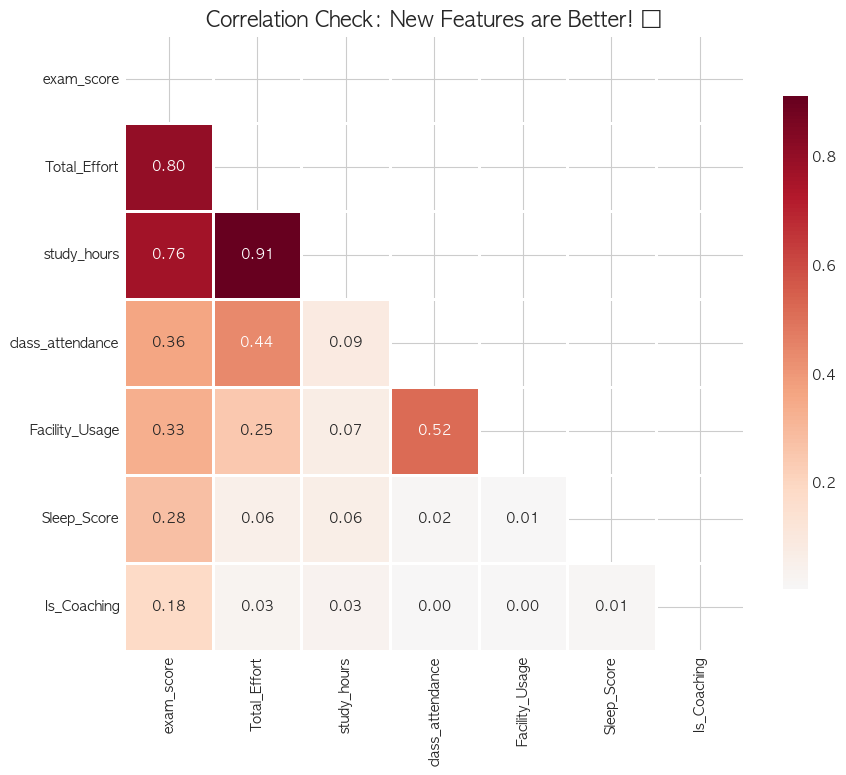

In [75]:
# 매핑
mapping = {'poor': 1, 'average': 2, 'good': 3, 'low': 1, 'medium': 2, 'high': 3}
df['sleep_quality_num'] = df['sleep_quality'].map(mapping)
df['facility_rating_num'] = df['facility_rating'].map(mapping)

# ★ 핵심 파생변수 만들기
df['Total_Effort'] = df['study_hours'] * df['class_attendance']
df['Sleep_Score'] = df['sleep_hours'] * df['sleep_quality_num']
df['Facility_Usage'] = df['class_attendance'] * df['facility_rating_num']
df['Is_Coaching'] = (df['study_method'] == 'coaching').astype(int)

# 2. 상관관계 계산
cols = ['exam_score', 'Total_Effort', 'study_hours', 'class_attendance', 
        'Facility_Usage', 'Sleep_Score', 'Is_Coaching']
corr = df[cols].corr()

# 3. 그래프 그리기 (히트맵)
plt.figure(figsize=(10, 8))
mask = np.triu(np.ones_like(corr, dtype=bool)) # 위쪽 삼각형 가리기 (중복 제거)

sns.heatmap(corr, annot=True, fmt=".2f", cmap='RdBu_r', center=0, mask=mask,
            linewidths=1, cbar_kws={"shrink": .8})

plt.title('Correlation Check: New Features are Better! 🚀', fontsize=15, fontweight='bold')
plt.show()